# Simple Mathematical Models with very complicated dynamics
*Inspired by the equally named paper by Robert M. May and [Veritasium](https://www.youtube.com/watch?v=ovJcsL7vyrk])*

To dos:
* write out bullets
* fine tune plots

## First Order Difference Equation

* Motivation for first-difference equations
* Any first order difference equation: $F(X_{t+1})= F(X_{t})$ 
* Our first difference equation: $N_{t+1} = rN_t(1-N_t)$
* Idea behind it: 
    * percentage of total pop
    * growing but with negative feedback loop
    * reaches an equilibrium that hinges on r
    * appears in nature
 

In [1]:
import pandas as pd
pd.options.display.float_format = '{:.3f}'.format
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
%config InlineBackend.figure_format='retina'
import random

In [3]:
# How does N_t behave in comparison to N_t+1?

def first_dif_eq_1(N_0 = 0.01, r = 2.707, time_horizon = 100):
    N_list = []
    N_1_list = []
    i_list = []
    N = N_0
    
    for i in range (1,time_horizon+1) :    
        
        N_1 = r*N*(1-N)

        N_list.append(N)
        N_1_list.append(N_1)
        i_list.append(i)
        
        N = N_1
        
    return pd.DataFrame({'time': i_list,'N': N_list, 'N_1': N_1_list}) 

def iterate_rs(r_range = range(100,401)):
    
    r_list = []
    terminal_val_list = []
    
    for r in r_range:
        r = r/100
        r_list.append(r)
        terminal_val_list.append(first_dif_eq_1(r = r, time_horizon = random.randrange(100,150)).tail(1)["N_1"].sum())
    
    return pd.DataFrame({"r": r_list, "Terminal_Val": terminal_val_list})


def iterate_iterates(n):
    initial_iteration = iterate_rs()
    all_dfs = initial_iteration.merge(iterate_rs(), on= "r")
    
    for i in range(0,n): 
        all_dfs = all_dfs.merge(iterate_rs(), on= "r", suffixes = (str(i),str(i+1)))
    
    return all_dfs

Doing first population growth rate: 
* 30% starting population
* r = 2.707

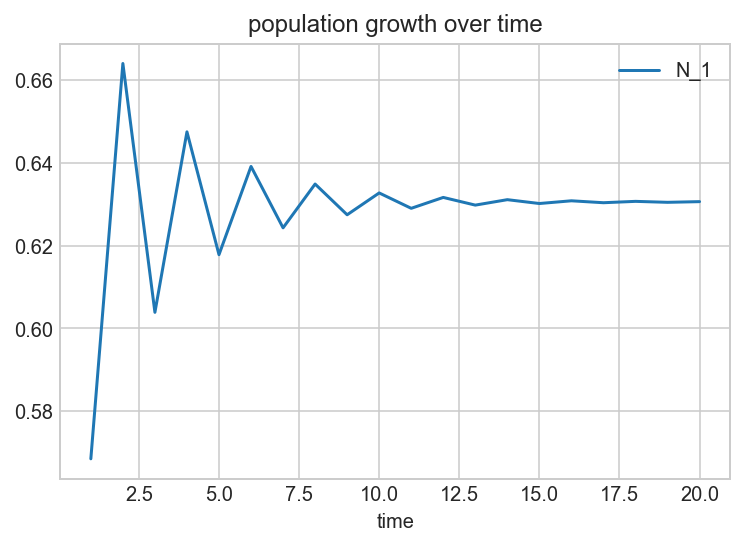

In [4]:
first_dif_eq_1(N_0 = 0.3, r=2.707, time_horizon = 20).plot(x= "time", y = "N_1", title = "population growth over time");

How do different r values affect the path of population growth? 

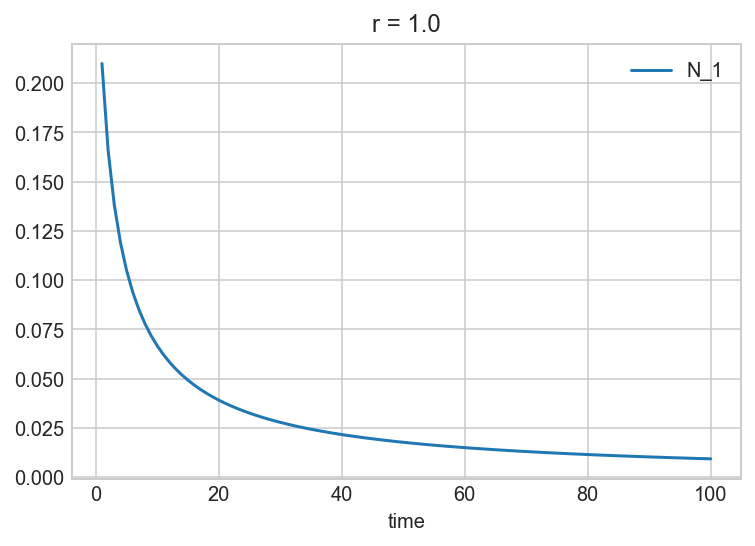

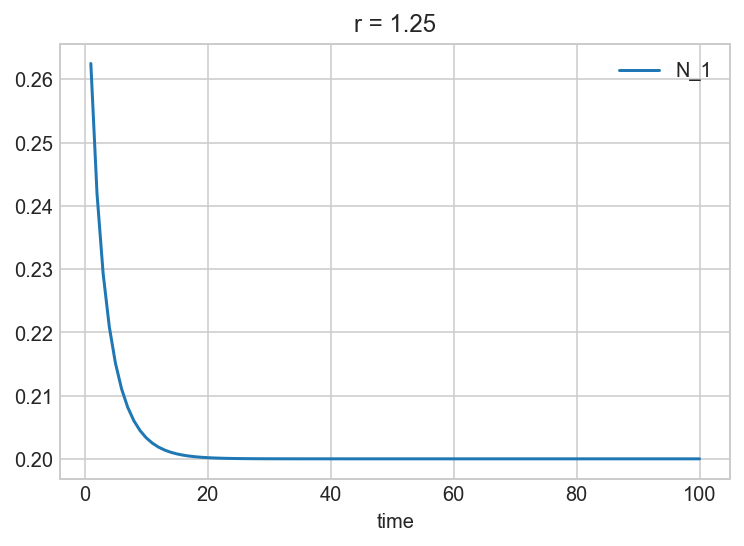

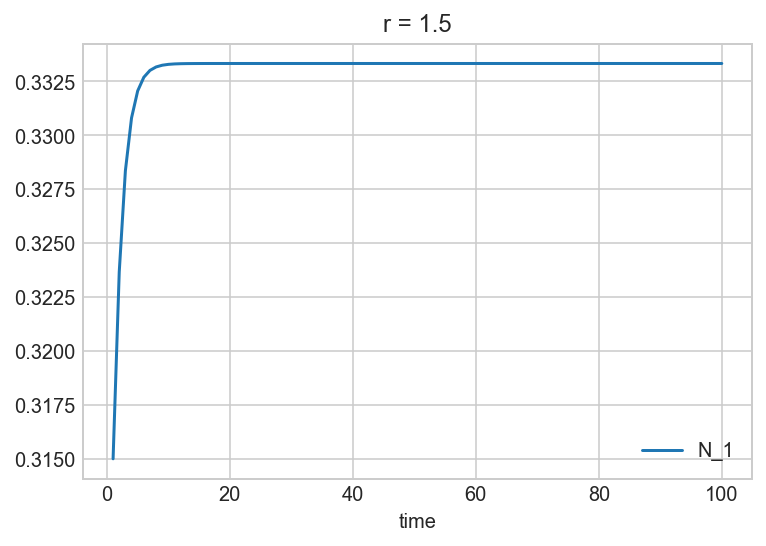

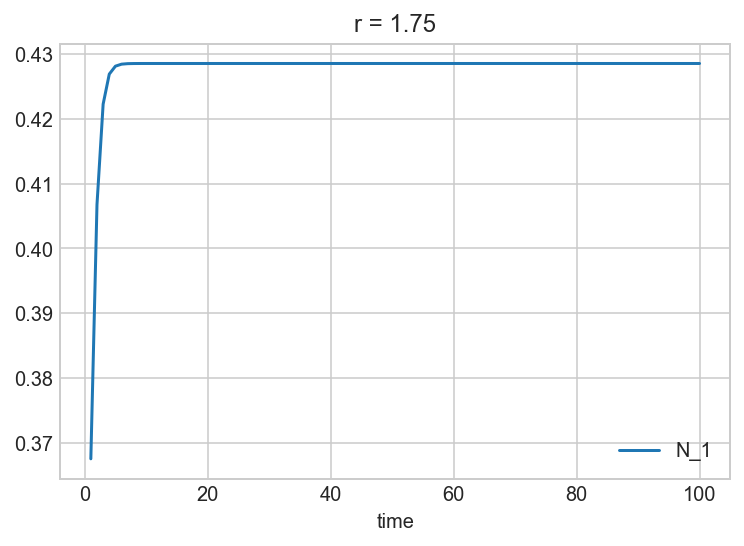

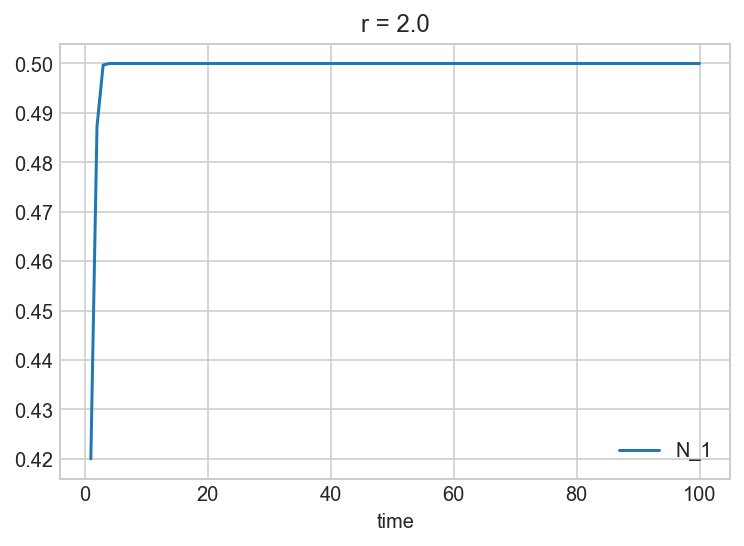

...

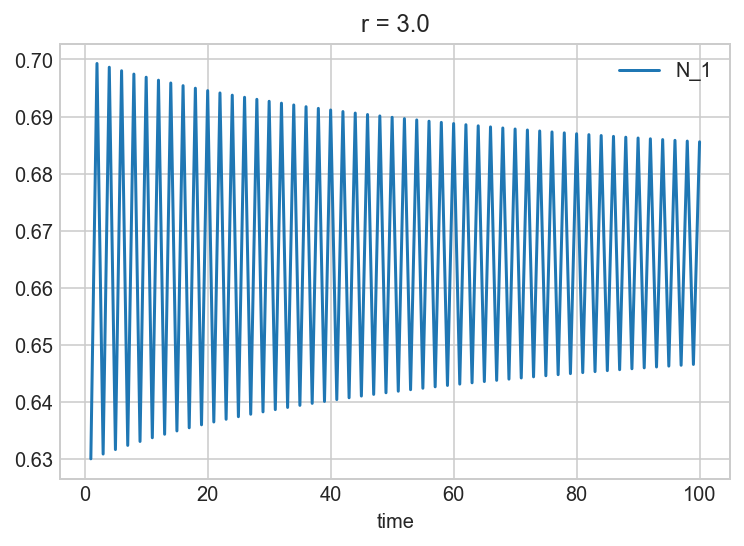

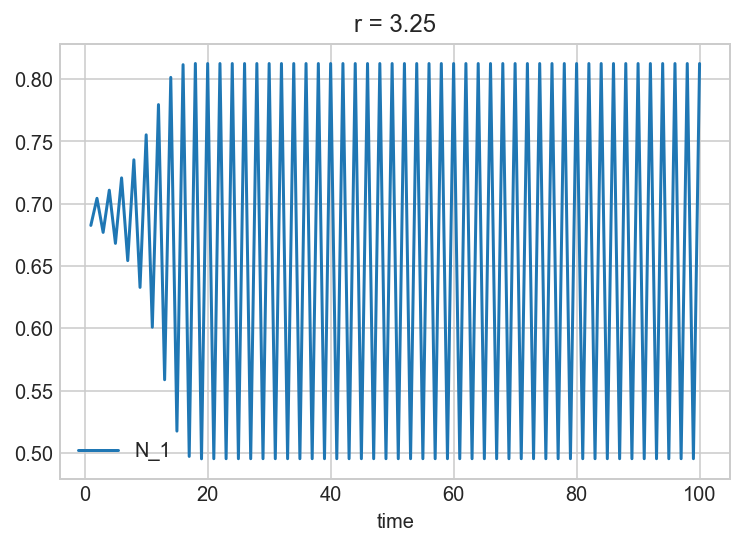

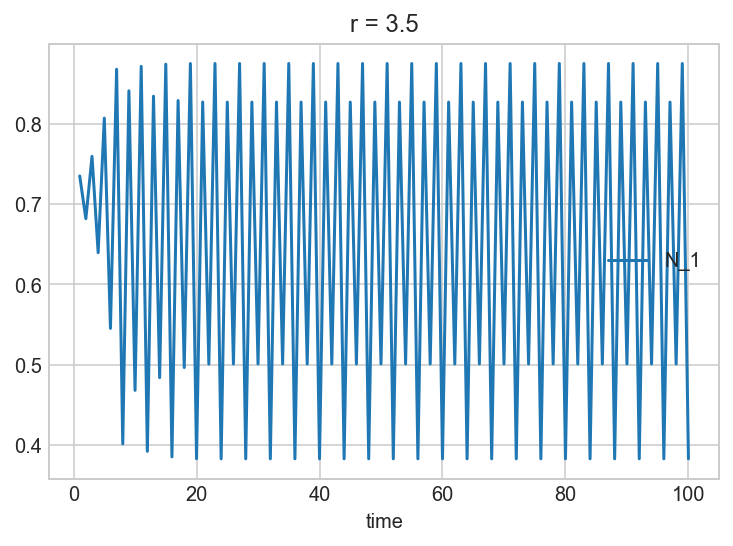

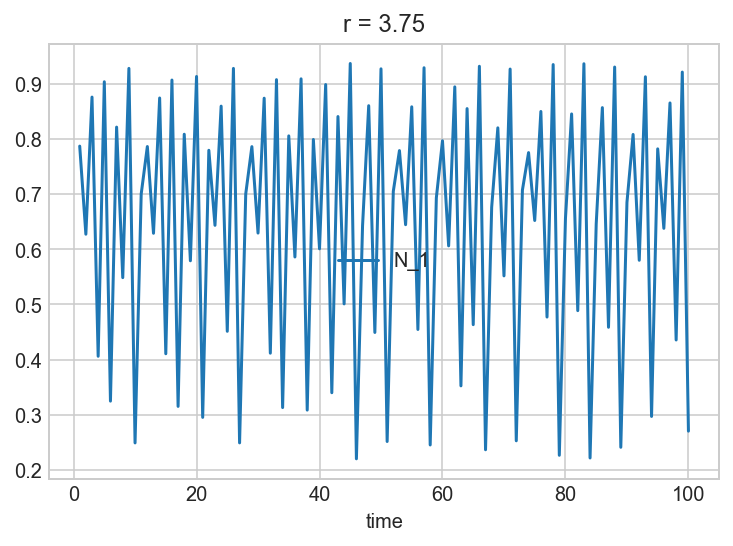

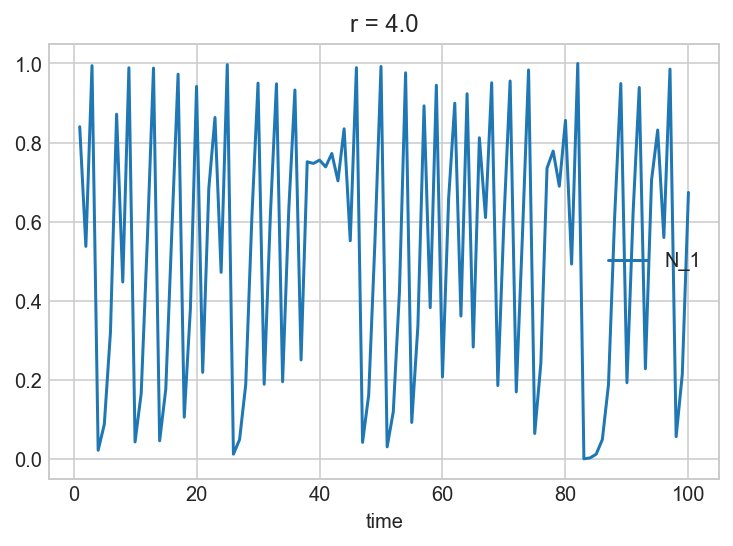

In [5]:
for r in range(100,410, 25):
    r = r/100
    first_dif_eq_1(N_0 = 0.3, r = r, time_horizon = 100).plot(x = "time", y = "N_1", title= "r = "+str(r))

### The Bifurcation Diagram - from predictable to pseudo-random outcomes

Next we plot the long-term equilibrium values for different r-rates. We iterate through 300 different r-rates between 1 and 4. However, because in certain r-ranges the final outcome is a oscillating time series, we define the "long-term" as a random number between 100 and 150 and run the population growth simulation 100 times for each r. As can be seen in the charts above (and below), after 100 reproduction rounds, all populations with deterministic r-values reach that value, whilst all those who can oscillate do so. This leaves us with a neat representation of the bifurcation diagram. In which at regular shorter and shorter intervals, there r-value oscilates between more and more values until finally it ends in randomness.

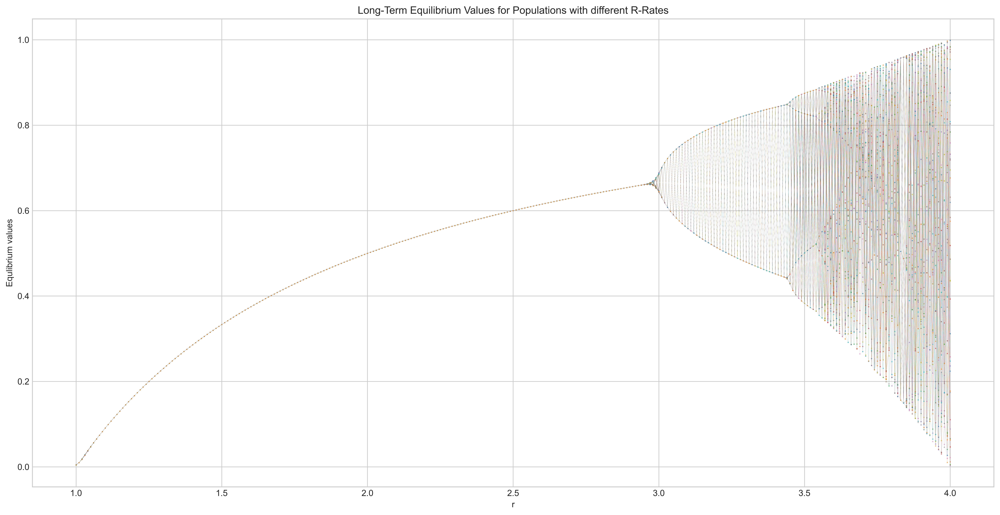

In [6]:
iterate_df = iterate_iterates(100)
iterate_df = iterate_df.set_index("r")

fig, ax = plt.subplots(figsize=(20, 10), dpi=300) 
ax.plot(iterate_df, linestyle='--', marker='.', markersize=0.5, linewidth=0.05)
ax.set_xlabel("r")
ax.set_ylabel("Equlibrium values")
ax.set_title("Long-Term Equilibrium Values for Populations with different R-Rates")
fig.savefig('to.png')

How are the values for final population outcomes distributed at different points of r? At r = 4 (last row in df) it should be distributed more or less evenly. The plot below shows that this is true.

0
100
200
300


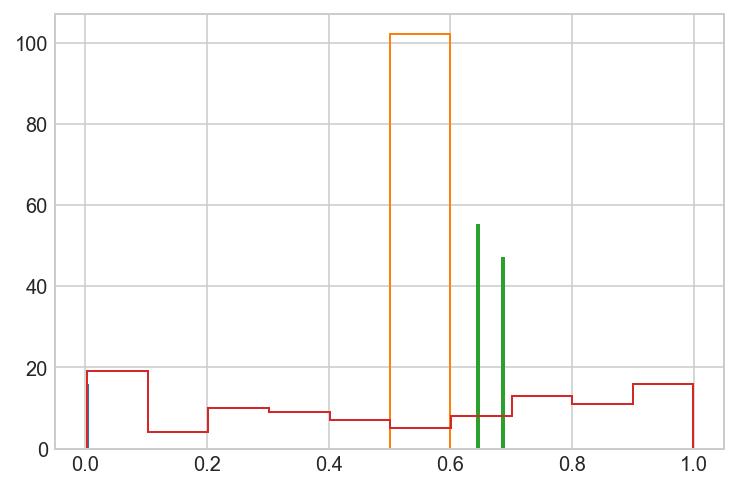

In [7]:
for i in range (0,301,100):
    print (i)
    iterate_df.iloc[i,:].hist(cumulative=False, histtype="step")